# Evaluating the relationship between in vitro pyrimethamine sensitivity and gene expression across a panel of cancer cell lines

# Background

## Introduction
Pyrimethamine is an FDA-approved antimicrobial compound used for the treatment of toxoplasmosis. Pyrimethamine kills the Toxoplasma gondii parasite by inhibiting an enzyme required for parasitic growth. Interestingly, the Frank Laboratory at Dana-Farber Cancer Institute has also identified pyrimethamine as a novel inhibitor of STAT3, which is a protein that regulates gene expression and is known to cause many types of human cancer. Since pyrimethamine is already FDA-approved and known to be active and safe in humans, its potential as a STAT3 inhibitor, and thus as an anticancer agent, has significant therapeutic potential.

However, to better understand which cancer patients will benefit from treatment with pyrimethamine, we need to know how pyrimethamine kills cancer cells. One data-driven approach is to look for correlations between in vitro pyrimethamine sensitivity and messenger RNA (mRNA) levels (also called gene expression). At a basic level, DNA is transcribed into mRNA, which is then translated into functional protein. Accordingly, mRNA can be used as a proxy, albeit an imperfect one, for protein levels. Based on this approach, one simple hypothesis is that if pyrimethamine kills cancer cells by inhibiting a certain protein or group of proteins, cells that express that protein or group of proteins (and thus have higher levels of the corresponding mRNAs) should be more sensitive to pyrimethamine.

## Data Source
To test this hypothesis, I first obtained in vitro pyrimethamine sensitivity data from the Genomics of Drug Sensitivity in Cancer (GDSC) dataset. This dataset contains both IC50 values and AUC values for 400 cancer cell lines treated with pyrimethamine at concentrations ranging from 0.0781 uM to 20 uM. By way of review, the IC50 value is defined as the concentration of drug at which 50% of the cells are viable (also known as the half-maximal inhibitory concentration). AUC refers to the area under the curve, which in this case is the pyrimethamine dose-response curve from which the IC50 value was extracted.

In addition to the GDSC dataset, I obtained cancer cell line mRNA expression data (Expression Public 20Q1) from the Cancer Cell Line Encyclopedia (CCLE) and the Cancer Dependency Map (DepMap). This dataset contains a quantitative measure of mRNA expression for 19,144 genes across 1,270 cell lines representing 32 primary diseases. mRNA expression is measured in units of transcripts per million (TPM).

For the purposes of this report, I am going to assume that human-derived cancer cell lines are a reasonable model for human cancer.

## Brief Disclaimer
This capstone is an extension of my first capstone. Rather than manually selecting cutoffs for pyrimethamine sensitivity, I will use unsupervised clustering models to group the cell lines into sensitive, partially sensitive, and resistant. Then, I will use mRNA expression data from all genes (~19,000) rather than just 12 genes of interest and use unsupervised clustering models to group the cell lines based on gene expression. Finally, I will visualize the gene expression clusters and overlay the senstivity labels via color to determine whether cell lines with similar gene expression patterns (same cluster) show similar sensitivities to pyrimethamine (same color).

In [63]:
# Import libraries
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import re
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
import umap
from sklearn import metrics
%matplotlib inline

# Load Data

In [64]:
# Load data from CSV files into data frames
gdsc_df = pd.read_csv('GDSC_PYR.csv') # GDSC pyrimethamine sensitivity data
ccle_df = pd.read_csv('CCLE_expression.csv') # CCLE gene expression data
info_df = pd.read_csv('sample_info.csv') # CCLE cell line key

In [65]:
# Preview first 5 lines of gdsc_df
gdsc_df.head()

,Cell line,TCGA classification,Tissue,Tissue sub-type,IC50,AUC
0,LS-411N,COREAD,digestive_system,large_intestine,0.722230,0.420598
1,ES1,UNCLASSIFIED,bone,ewings_sarcoma,1.027104,0.470035
2,ES8,UNCLASSIFIED,bone,ewings_sarcoma,1.069459,0.474589
3,ALL-PO,ALL,blood,lymphoblastic_leukemia,1.134090,0.484931
4,WIL2-NS,UNCLASSIFIED,blood,lymphoid_neoplasm_other,1.196133,0.492336


# Clean and Process Data

In [66]:
# Drop TCGA classification, Tissue, and Tissue sub-type from gdsc_df
columns_to_drop = ['TCGA classification', 'Tissue', 'Tissue sub-type']
gdsc_df.drop(columns_to_drop, axis=1, inplace=True)

# Remove dashes and spaces from Cell line entries in gdsc_df
gdsc_df['cell_line'] = gdsc_df['Cell line'].str.replace('-', '').str.upper()
gdsc_df.drop('Cell line', axis=1, inplace=True)

# Standardize column naming
gdsc_df.columns = gdsc_df.columns.str.replace(' ', '').str.lower()

# Set ic50 values above max screening concentration to max screening concentration
# 20 uM was the max screening concentration
IC50_list = []

for IC50 in gdsc_df['ic50']:
    if IC50 > 20:
        IC50_list.append(20)
    else:
        IC50_list.append(IC50)
    
gdsc_df['adjusted_ic50'] = IC50_list

# Check resulting data frame
gdsc_df.head()

,ic50,auc,cell_line,adjusted_ic50
0,0.722230,0.420598,LS411N,0.722230
1,1.027104,0.470035,ES1,1.027104
2,1.069459,0.474589,ES8,1.069459
3,1.134090,0.484931,ALLPO,1.134090
4,1.196133,0.492336,WIL2NS,1.196133


In [67]:
# Preview first 5 lines of info_df
info_df.head()

,DepMap_ID,stripped_cell_line_name,CCLE_Name,alias,COSMIC_ID,lineage,lineage_subtype,lineage_sub_subtype,lineage_molecular_subtype,sex,...,culture_medium,cas9_activity,RRID,sample_collection_site,primary_or_metastasis,disease,disease_subtype,age,Sanger_model_ID,additional_info
0,ACH-000001,NIHOVCAR3,NIHOVCAR3_OVARY,OVCAR3,905933.0,ovary,ovary_adenocarcinoma,high_grade_serous,NaN,Female,...,NaN,NaN,CVCL_0465,ascites,Metastasis,Ovarian Cancer,"Adenocarcinoma, high grade serous",60.0,SIDM00105,NaN
1,ACH-000002,HL60,HL60_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NaN,905938.0,blood,AML,M3,NaN,Female,...,NaN,NaN,CVCL_0002,haematopoietic_and_lymphoid_tissue,Primary,Leukemia,"Acute Myelogenous Leukemia (AML), M3 (Promyelo...",35.0,SIDM00829,NaN
2,ACH-000003,CACO2,CACO2_LARGE_INTESTINE,"CACO2, CaCo-2",NaN,colorectal,colorectal_adenocarcinoma,NaN,NaN,Male,...,NaN,NaN,CVCL_0025,Colon,NaN,Colon/Colorectal Cancer,Adenocarcinoma,NaN,SIDM00891,NaN
3,ACH-000004,HEL,HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NaN,907053.0,blood,AML,M6,NaN,Male,...,RPMI-1640: 10%FBS,47.6,CVCL_0001,haematopoietic_and_lymphoid_tissue,NaN,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",30.0,SIDM00594,NaN
4,ACH-000005,HEL9217,HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NaN,NaN,blood,AML,M6,NaN,Male,...,RPMI; 10% FBS,13.4,CVCL_2481,bone_marrow,NaN,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",30.0,SIDM00593,NaN


In [68]:
# Drop all columns except DepMap_ID, stripped_cell_line_name, and lineage
columns_to_drop = ['CCLE_Name', 'alias','COSMIC_ID', 'lineage_subtype', 'lineage_sub_subtype',
       'lineage_molecular_subtype', 'sex', 'source', 'Achilles_n_replicates',
       'cell_line_NNMD', 'culture_type', 'culture_medium', 'cas9_activity',
       'RRID', 'sample_collection_site', 'primary_or_metastasis', 'disease',
       'disease_subtype', 'age', 'Sanger_model_ID', 'additional_info']

info_df.drop(columns_to_drop, axis=1, inplace=True)

# Standardize column naming
info_df.columns = info_df.columns.str.replace(' ', '').str.lower()

# Check resulting data frame
info_df.head()

,depmap_id,stripped_cell_line_name,lineage
0,ACH-000001,NIHOVCAR3,ovary
1,ACH-000002,HL60,blood
2,ACH-000003,CACO2,colorectal
3,ACH-000004,HEL,blood
4,ACH-000005,HEL9217,blood


In [69]:
# Preview first 5 lines of ccle_df
ccle_df.head()

,Unnamed: 0,TSPAN6 (7105),TNMD (64102),DPM1 (8813),SCYL3 (57147),C1orf112 (55732),FGR (2268),CFH (3075),FUCA2 (2519),GCLC (2729),...,SCYGR3 (112441429),SCYGR7 (112441438),OR8S1 (341568),SCYGR6 (112441431),OR4F29 (729759),EEF1AKMT4 (110599564),TBCE (6905),OOSP4A (112577462),ARHGAP11B (89839),OOSP3 (112577461)
0,ACH-001097,0.000000,0.0,4.667324,1.761285,3.554589,4.358959,0.641546,2.201634,1.941106,...,0.0,0.0,0.0,0.0,0.0,2.980025,5.132988,0.0,0.443607,0.000000
1,ACH-001636,0.000000,0.0,6.198887,2.032101,3.755956,2.601697,0.000000,0.000000,3.415488,...,0.0,0.0,0.0,0.0,0.0,4.322649,4.100978,0.0,2.589763,0.298658
2,ACH-001804,4.934988,0.0,6.635464,1.929791,2.503349,0.000000,4.883621,6.772546,3.889474,...,0.0,0.0,0.0,0.0,0.0,2.283922,4.288359,0.0,0.475085,0.000000
3,ACH-000534,0.839960,0.0,5.376082,2.687061,4.440288,4.938286,0.536053,3.584963,2.935460,...,0.0,0.0,0.0,0.0,0.0,1.333424,4.841470,0.0,3.904966,0.000000
4,ACH-000742,3.722466,0.0,6.029674,2.192194,2.533563,0.150560,5.933809,6.973382,5.192194,...,0.0,0.0,0.0,0.0,0.0,1.526069,4.494416,0.0,0.941106,0.000000


In [70]:
# Merge ccle_df with info_df on depmap_id
ccle_info_merge = pd.merge(left=ccle_df, right=info_df, left_on='Unnamed: 0', right_on='depmap_id', how='inner')

# Merge ccle_info_merge with gdsc_df on cell_line
final_df = pd.merge(left=ccle_info_merge, right=gdsc_df, left_on='stripped_cell_line_name', right_on='cell_line', how='inner')

# Check resulting data frame
final_df

,Unnamed: 0,TSPAN6 (7105),TNMD (64102),DPM1 (8813),SCYL3 (57147),C1orf112 (55732),FGR (2268),CFH (3075),FUCA2 (2519),GCLC (2729),...,OOSP4A (112577462),ARHGAP11B (89839),OOSP3 (112577461),depmap_id,stripped_cell_line_name,lineage,ic50,auc,cell_line,adjusted_ic50
0,ACH-000534,0.839960,0.000000,5.376082,2.687061,4.440288,4.938286,0.536053,3.584963,2.935460,...,0.0,3.904966,0.0,ACH-000534,WSUDLCL2,lymphocyte,118.254671,0.984830,WSUDLCL2,20.000000
1,ACH-000981,0.659925,0.000000,5.790772,3.282440,4.945795,6.610434,5.170726,1.257011,4.932628,...,0.0,0.555816,0.0,ACH-000981,DND41,NaN,6.691083,0.769990,DND41,6.691083
2,ACH-001400,2.737687,0.000000,3.758090,0.823749,1.000000,0.516015,3.447579,3.250962,2.341986,...,0.0,0.687061,0.0,ACH-001400,SW954,cervix,78.991247,0.964064,SW954,20.000000
3,ACH-001702,4.917432,0.000000,6.639956,1.622930,3.600508,0.000000,0.111031,6.551824,3.587365,...,0.0,0.895303,0.0,ACH-001702,VAESBJ,NaN,12.583186,0.825335,VAESBJ,12.583186
4,ACH-000772,0.464668,0.000000,6.776367,2.336283,3.456806,0.163499,3.561937,2.459432,4.257765,...,0.0,1.835924,0.0,ACH-000772,TE441T,soft_tissue,48.295147,0.942900,TE441T,20.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,ACH-000394,3.112700,0.056584,5.619413,3.207893,4.827819,0.150560,3.526069,4.401903,4.695437,...,0.0,2.364572,0.0,ACH-000394,NCIH2081,lung,254.331353,0.983144,NCIH2081,20.000000
227,ACH-000795,0.815575,0.000000,6.015248,3.073820,5.103078,3.032101,2.799087,0.622930,4.489928,...,0.0,3.747387,0.0,ACH-000795,MOLT13,NaN,30.074103,0.921472,MOLT13,20.000000
228,ACH-000514,4.886550,0.000000,5.739038,3.005400,4.626439,0.641546,2.114367,4.303050,4.990047,...,0.0,2.904966,0.0,ACH-000514,NCIH1092,lung,214.007094,0.972662,NCIH1092,20.000000
229,ACH-000864,2.735522,0.000000,5.581050,2.748461,3.570463,0.042644,0.097611,4.812498,4.745775,...,0.0,1.713696,0.0,ACH-000864,COLO684,NaN,6.336907,0.730798,COLO684,6.336907


In [71]:
# Clean up final_df by removing duplicate columns and
# standardizing column names
columns_to_drop = ['Unnamed: 0', 'depmap_id', 'stripped_cell_line_name']
final_df.drop(columns_to_drop, axis=1, inplace=True)

final_df.columns = final_df.columns.str.replace(' ', '').str.lower()
final_df.columns = final_df.columns.str.replace(' ?\([^)]+\)', '')

# Check resulting data frame
final_df

,tspan6,tnmd,dpm1,scyl3,c1orf112,fgr,cfh,fuca2,gclc,nfya,...,eef1akmt4,tbce,oosp4a,arhgap11b,oosp3,lineage,ic50,auc,cell_line,adjusted_ic50
0,0.839960,0.000000,5.376082,2.687061,4.440288,4.938286,0.536053,3.584963,2.935460,3.157044,...,1.333424,4.841470,0.0,3.904966,0.0,lymphocyte,118.254671,0.984830,WSUDLCL2,20.000000
1,0.659925,0.000000,5.790772,3.282440,4.945795,6.610434,5.170726,1.257011,4.932628,5.783719,...,2.893362,5.384395,0.0,0.555816,0.0,NaN,6.691083,0.769990,DND41,6.691083
2,2.737687,0.000000,3.758090,0.823749,1.000000,0.516015,3.447579,3.250962,2.341986,1.531069,...,0.659925,4.372256,0.0,0.687061,0.0,cervix,78.991247,0.964064,SW954,20.000000
3,4.917432,0.000000,6.639956,1.622930,3.600508,0.000000,0.111031,6.551824,3.587365,4.203201,...,2.639232,5.270155,0.0,0.895303,0.0,NaN,12.583186,0.825335,VAESBJ,12.583186
4,0.464668,0.000000,6.776367,2.336283,3.456806,0.163499,3.561937,2.459432,4.257765,4.747924,...,1.422233,5.234578,0.0,1.835924,0.0,soft_tissue,48.295147,0.942900,TE441T,20.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,3.112700,0.056584,5.619413,3.207893,4.827819,0.150560,3.526069,4.401903,4.695437,4.957915,...,4.063503,5.163499,0.0,2.364572,0.0,lung,254.331353,0.983144,NCIH2081,20.000000
227,0.815575,0.000000,6.015248,3.073820,5.103078,3.032101,2.799087,0.622930,4.489928,5.514438,...,3.014355,4.677508,0.0,3.747387,0.0,NaN,30.074103,0.921472,MOLT13,20.000000
228,4.886550,0.000000,5.739038,3.005400,4.626439,0.641546,2.114367,4.303050,4.990047,5.031219,...,3.238787,5.713421,0.0,2.904966,0.0,lung,214.007094,0.972662,NCIH1092,20.000000
229,2.735522,0.000000,5.581050,2.748461,3.570463,0.042644,0.097611,4.812498,4.745775,4.888987,...,2.028569,5.799605,0.0,1.713696,0.0,NaN,6.336907,0.730798,COLO684,6.336907


In [72]:
# Create data frame for X (variables)
columns_to_drop = ['lineage', 'ic50', 'auc', 'cell_line', 'adjusted_ic50']
X_sens = final_df[['adjusted_ic50', 'auc']]
X_exp = final_df.drop(columns_to_drop, axis=1)

In [73]:
# Use MinMaxScaler to transform X_sens and X_exp
# and reassign to respective data frames
scaler = MinMaxScaler()
sens_mm = scaler.fit_transform(X_sens)
exp_mm = scaler.fit_transform(X_exp)

X_sens_mm = pd.DataFrame(sens_mm, index=X_sens.index, columns=X_sens.columns)
X_exp_mm = pd.DataFrame(exp_mm, index=X_exp.index, columns=X_exp.columns)

In [74]:
# Check resulting data frame
X_sens_mm

,adjusted_ic50,auc
0,1.000000,0.992690
1,0.309624,0.614708
2,1.000000,0.956155
3,0.615266,0.712080
4,1.000000,0.918920
...,...,...
226,1.000000,0.989724
227,1.000000,0.881220
228,1.000000,0.971282
229,0.291251,0.545755


In [75]:
# Check resulting data frame
X_exp_mm

,tspan6,tnmd,dpm1,scyl3,c1orf112,fgr,cfh,fuca2,gclc,nfya,...,scygr3,scygr7,or8s1,scygr6,or4f29,eef1akmt4,tbce,oosp4a,arhgap11b,oosp3
0,0.123448,0.000000,0.303694,0.553686,0.691039,0.615552,0.062154,0.467728,0.167532,0.337615,...,0.0,0.0,0.000000,0.0,0.000000,0.148446,0.518041,0.0,0.955637,0.0
1,0.096989,0.000000,0.381531,0.730604,0.792579,0.823983,0.599529,0.164002,0.460897,0.883013,...,0.0,0.0,0.000000,0.0,0.000000,0.492272,0.673486,0.0,0.048048,0.0
2,0.402357,0.000000,0.000000,0.000000,0.000000,0.064321,0.399736,0.424151,0.080356,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.383700,0.0,0.083614,0.0
3,0.722713,0.000000,0.540921,0.237478,0.522356,0.000000,0.012874,0.854813,0.263291,0.554837,...,0.0,0.0,0.000000,0.0,0.020626,0.436259,0.640778,0.0,0.140046,0.0
4,0.068292,0.000000,0.566525,0.449452,0.493491,0.020380,0.412995,0.320881,0.361766,0.667943,...,0.0,0.0,0.000000,0.0,0.253340,0.168020,0.630592,0.0,0.394946,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,0.457472,0.032685,0.349367,0.708452,0.768882,0.018767,0.408836,0.574314,0.426056,0.711545,...,0.0,0.0,0.064155,0.0,0.216323,0.750183,0.610241,0.0,0.538205,0.0
227,0.119865,0.000000,0.423664,0.668612,0.824172,0.377948,0.324545,0.081273,0.395868,0.827100,...,0.0,0.0,0.000000,0.0,0.061271,0.518940,0.471097,0.0,0.912935,0.0
228,0.718174,0.000000,0.371820,0.648281,0.728431,0.079968,0.245154,0.561417,0.469331,0.726765,...,0.0,0.0,0.000000,0.0,0.041048,0.568407,0.767689,0.0,0.684646,0.0
229,0.402038,0.000000,0.342166,0.571931,0.516321,0.005316,0.011318,0.627884,0.433450,0.697233,...,0.0,0.0,0.021803,0.0,0.000000,0.301663,0.792365,0.0,0.361823,0.0


# Cluster Cell Lines Based on IC50 and AUC (Pyrimethamine Sensitivity)
Cluster as sensitive, partially sensitive, or resistant to pyrimethamine

### K-means

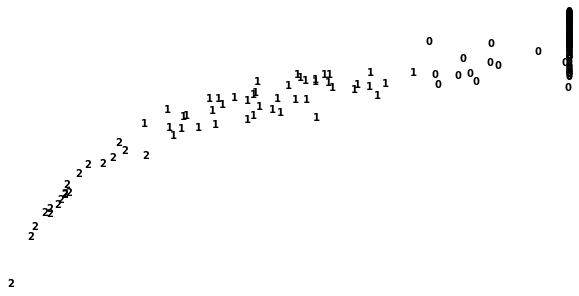

In [14]:
# Use k-means to cluster based on pyrimethamine sensitivity (adjusted_ic50 and auc)
k_means = KMeans(n_clusters=3, random_state=123)
y_pred = k_means.fit_predict(X_sens_mm)

plt.figure(figsize=(10, 5))

for i in range(X_sens_mm.shape[0]):
    plt.text(X_sens_mm['adjusted_ic50'][i], X_sens_mm['auc'][i], str(y_pred[i]),
             fontdict={'weight': 'bold', 'size': 10}
            )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [15]:
print('Silhouette Score: {}'.format(metrics.silhouette_score(X_sens_mm, y_pred, metric='euclidean')))

Silhouette Score: 0.7670684080090362


#### Conclusion
The observations are not distributed isotropically, so k-means is probably not the best clustering model to use here.

### Hierarchical

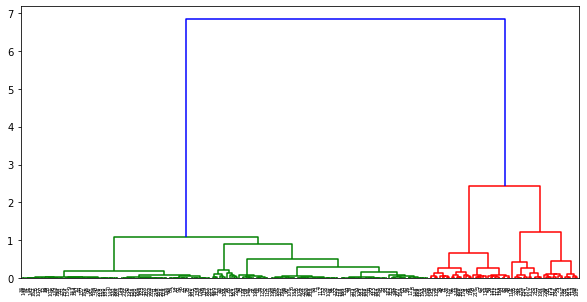

In [16]:
# Use dendrogram to select parameters for hierarchical clustering
plt.figure(figsize=(10, 5))
dendrogram(linkage(X_sens_mm, method='ward'))
plt.show()

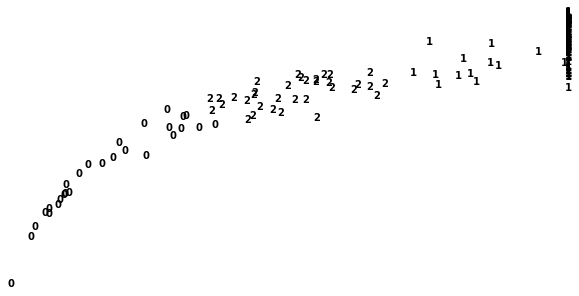

In [17]:
# Use hierarchical modeling to cluster based on pyrimethamine sensitivity (adjusted_ic50 and auc)
agg_cluster = AgglomerativeClustering(linkage='ward', 
                                      affinity='euclidean',
                                      n_clusters=3)

y_pred = agg_cluster.fit_predict(X_sens_mm)

plt.figure(figsize=(10, 5))

for i in range(X_sens_mm.shape[0]):
    plt.text(X_sens_mm['adjusted_ic50'][i], X_sens_mm['auc'][i], str(y_pred[i]),
             fontdict={'weight': 'bold', 'size': 10}
            )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [18]:
print('Silhouette Score: {}'.format(metrics.silhouette_score(X_sens_mm, y_pred, metric='euclidean')))

Silhouette Score: 0.7361761816040059


#### Conclusion
The agglomerative clustering model performed relatively well, but was slightly eclipsed in silhouette score by GMM (see below).

### DBSCAN

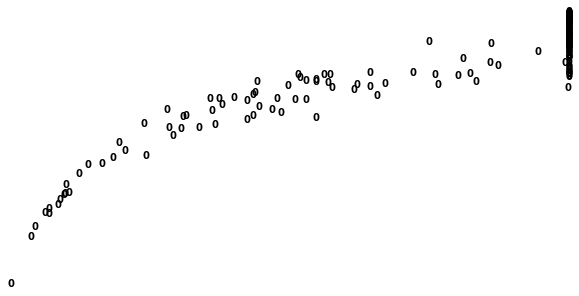

In [19]:
# Use DBSCAN to cluster based on pyrimethamine sensitivity (adjusted_ic50 and auc)
dbscan_cluster = DBSCAN(eps=5, min_samples=25)

y_pred = dbscan_cluster.fit_predict(X_sens_mm)

plt.figure(figsize=(10, 5))

for i in range(X_sens_mm.shape[0]):
    plt.text(X_sens_mm['adjusted_ic50'][i], X_sens_mm['auc'][i], str(y_pred[i]),
             fontdict={'weight': 'bold', 'size': 10}
            )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

#### Conclusion
I was unable to get more than one cluster using DBSCAN (tried eps ranging from 1-50 and min samples ranging from 5-150).

### GMM

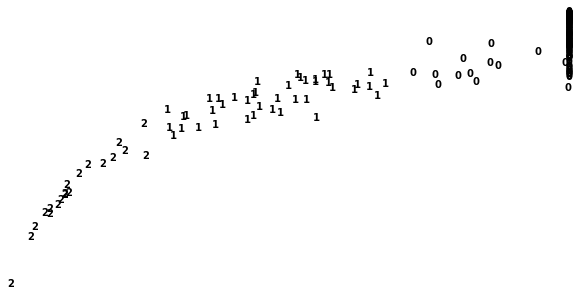

In [20]:
# Use gaussian mixture model (GMM) to cluster based on pyrimethamine sensitivity (adjusted_ic50 and auc)
gmm_cluster = GaussianMixture(n_components=3,
                              covariance_type='tied',
                              random_state=123)

y_pred = gmm_cluster.fit_predict(X_sens_mm)

plt.figure(figsize=(10, 5))

for i in range(X_sens_mm.shape[0]):
    plt.text(X_sens_mm['adjusted_ic50'][i], X_sens_mm['auc'][i], str(y_pred[i]),
             fontdict={'weight': 'bold', 'size': 10}
            )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [21]:
print('Silhouette Score: {}'.format(metrics.silhouette_score(X_sens_mm, y_pred, metric='euclidean')))

Silhouette Score: 0.7634394637474717


#### Conclusion
GMM doesn't assume anything about the geometry of the clusters (unlike k-means), so it can be used to tackle non-linear and non-isotropic geometries. GMM resulted in the highest silhouette score outside of k-means, so I will use the GMM clustering results as my known outcome (y) moving forward where 0 refers to resistant, 1 refers to partially sensitive, and 2 refers to sensitive to pyrimethamine.

In [22]:
# Assign y_pred values to data frame and use 
# as outcome for following clustering analyses
y = pd.DataFrame(y_pred, columns=['pyr_sensitivity'], index=X_sens_mm.index)

# Check resulting data frame
y

,pyr_sensitivity
0,0
1,1
2,0
3,1
4,0
...,...
226,0
227,0
228,0
229,1


# Cluster Cell Lines Based on Gene Expression

## PCA for Dimensionality Reduction

In [23]:
# # Look at scree plot to determine optimal number of components
# Xt = X_exp_mm.T
# Cx = np.cov(Xt)

# eig_val_cov, eig_vec_cov = np.linalg.eig(Cx)

# plt.plot(eig_val_cov)
# plt.show()

# print(eig_val_cov)

In [24]:
# The scree plot step above was too computationally intensive,
# so instead I decided to try different values for n_components 
# until I was able to capture >90% of the total variance

# Perform PCA rather than UMAP for dimensionality reduction
# based on computational considerations (PCA is typically 
# faster than UMAP)
pca = PCA(n_components=146)
principal_components = pca.fit_transform(X_exp_mm)

print(
    'The percentage of total variance in the dataset explained by each',
    'component from Sklearn PCA:\n',
    pca.explained_variance_ratio_,
    '\n\nThe cumulative percentage of total variance in the dataset explained by',
    'the components from Sklearn PCA:\n',
    pca.explained_variance_ratio_.cumsum()
)

The percentage of total variance in the dataset explained by each component from Sklearn PCA:
 [0.13562057 0.09781576 0.04642647 0.03441394 0.03078785 0.02289519
 0.01973202 0.01720748 0.01500257 0.01359601 0.0130333  0.01224272
 0.0113203  0.01091561 0.01003554 0.00958679 0.00912775 0.00827777
 0.00782577 0.00757619 0.0074059  0.00697824 0.00677726 0.00639591
 0.00610563 0.00585777 0.00572998 0.00557147 0.00544666 0.00538882
 0.00528341 0.00514748 0.00508958 0.00493891 0.00478247 0.00462416
 0.00452949 0.00444208 0.00434493 0.00428792 0.00424006 0.00418387
 0.00413038 0.00399636 0.00396177 0.00389808 0.00385739 0.00385054
 0.00375392 0.00365264 0.0036291  0.00355158 0.00353139 0.00350939
 0.00342496 0.00340864 0.00333714 0.00329107 0.00328251 0.00323842
 0.00323216 0.00315278 0.00310351 0.00304814 0.0030119  0.00298514
 0.00296486 0.00290742 0.00286058 0.00282516 0.00281789 0.0028
 0.00276054 0.00273124 0.0026947  0.00265656 0.00264339 0.0026064
 0.00258897 0.00256438 0.00251649 0.002

In [25]:
# Use pca components as features in model
X_pca = pd.DataFrame(data=principal_components)

# Review resulting data frame
X_pca

,0,1,2,3,4,5,6,7,8,9,...,136,137,138,139,140,141,142,143,144,145
0,-13.455581,-3.320588,1.950225,1.298557,-7.690489,0.231524,3.652536,4.547907,1.102729,-4.258476,...,-0.933945,-0.606711,-1.225151,-1.396916,-0.416077,0.191941,-0.237997,0.016824,-0.688856,-1.685336
1,-7.912946,-6.834479,-4.328564,-3.374894,1.007893,-2.785453,5.011065,-1.436036,1.919850,8.923734,...,-0.070641,0.422543,-1.192108,-0.460582,1.884030,1.061806,-1.425452,0.622204,0.511449,-0.239646
2,-14.763763,24.922514,17.190295,23.430121,-0.570098,6.933846,16.921952,-0.702565,-4.524745,-1.492333,...,-0.317441,0.424707,-0.019749,-0.442798,0.361531,0.577278,-0.110051,0.163499,-0.398724,0.621188
3,4.195021,9.604516,-3.298608,4.348581,-1.684444,-0.379643,1.437908,-0.075067,-1.504589,-0.967244,...,0.310610,0.174179,1.460944,0.157108,-0.404538,-0.741374,-0.049690,-0.385293,0.040283,-0.246886
4,6.541198,-1.973764,-4.501371,1.136057,1.299626,-2.512295,0.758336,-1.502659,5.109929,1.046121,...,0.213103,0.041991,-0.276627,-0.239092,0.415838,-0.300349,0.082328,-0.138185,0.518998,-0.011245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,13.967590,-11.739902,6.701352,0.237494,0.811612,4.562541,-0.914067,4.387650,-2.512177,0.548954,...,0.421272,0.316831,0.187288,0.090432,0.787120,0.824068,-0.062939,-1.631994,-0.421181,1.612678
227,-7.994108,-10.246817,-2.463934,-3.783185,2.728898,-2.326135,8.579471,-4.347814,1.715119,5.525163,...,0.246089,0.798966,-0.742259,-0.244389,0.503016,-2.308005,-0.160341,-0.914906,-0.369161,1.168817
228,16.110943,-16.760382,5.246366,0.967789,0.723489,3.687491,1.263981,5.029528,-2.327902,1.084832,...,-0.819875,-1.005273,1.595376,1.540972,-1.529032,-0.739604,2.156950,1.524230,0.294634,-1.260211
229,10.930217,-8.480853,2.962570,6.772047,1.253643,1.857787,-0.530907,0.858131,0.942911,-0.064714,...,-0.887192,1.373802,-0.385764,0.489871,0.355921,-0.301217,-0.001530,0.114547,-1.003364,0.553411


## Clustering and Visualization
Cluster cell lines by gene expression (numbers) and overlay sensitivity (color)

### K-means

In [26]:
# Use k-means to cluster based on gene expression (PCA)
k_means = KMeans(n_clusters=3, random_state=123)
y_pred = k_means.fit_predict(X_pca)

# Use first two PCA components for visualization
pca = PCA(n_components=2).fit_transform(X_pca)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

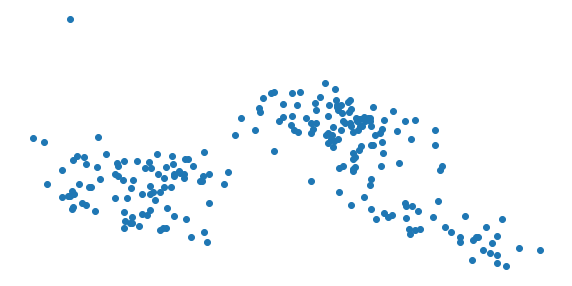

In [27]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(pca[:, 0], pca[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

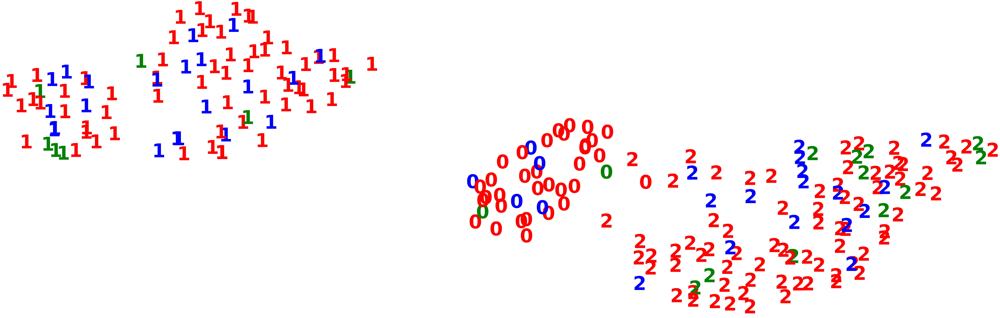

In [28]:
# Use UMAP to reduce dimensionality for visualization
umap_results = umap.UMAP(n_neighbors=25,
                      min_dist=0.9,
                      metric='euclidean').fit_transform(X_pca)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

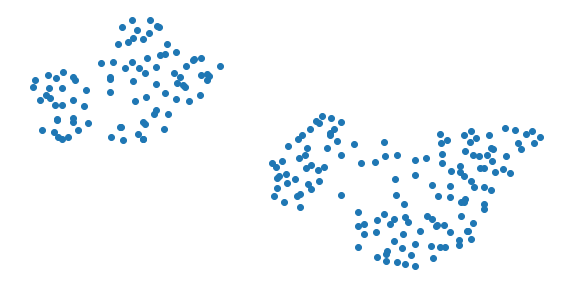

In [29]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [30]:
# Evaluate adjusted rand index (ARI) and silhouette score
ari = metrics.adjusted_rand_score(y['pyr_sensitivity'], y_pred)
ss = metrics.silhouette_score(X_pca, y_pred, metric='euclidean')

print('ARI: {}\n'.format(ari))
print('Silhouette Score: {}'.format(ss))

ARI: -0.014748060702945607

Silhouette Score: 0.14620127119429538


### Hierarchical

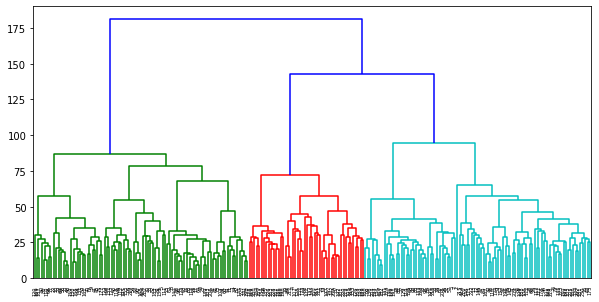

In [31]:
# Use dendrogram to select parameters for hierarchical clustering
plt.figure(figsize=(10, 5))
dendrogram(linkage(X_pca, method='ward'))
plt.show()

In [32]:
# Use hierarchical modeling to cluster based on gene expression (PCA)
agg_cluster = AgglomerativeClustering(linkage='ward', 
                                      affinity='euclidean',
                                      n_clusters=3)

y_pred = agg_cluster.fit_predict(X_pca)

# Use first two PCA components for visualization
pca = PCA(n_components=2).fit_transform(X_pca)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

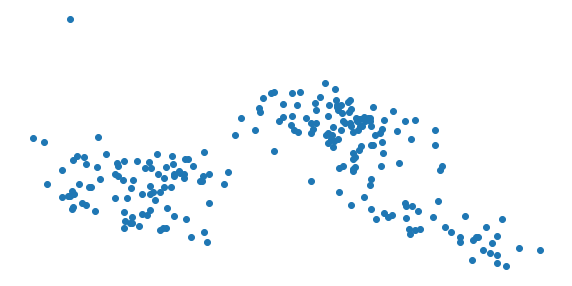

In [33]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(pca[:, 0], pca[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [34]:
# Evaluate adjusted rand index (ARI) and silhouette score
ari = metrics.adjusted_rand_score(y['pyr_sensitivity'], y_pred)
ss = metrics.silhouette_score(X_pca, y_pred, metric='euclidean')

print('ARI: {}\n'.format(ari))
print('Silhouette Score: {}'.format(ss))

ARI: -0.012666738433249296

Silhouette Score: 0.14232643080445706


### DBSCAN

In [35]:
# Use DBSCAN to cluster based on gene expression (PCA)
dbscan_cluster = DBSCAN(eps=24, min_samples=8)

y_pred = dbscan_cluster.fit_predict(X_pca)

# Use first two PCA components for visualization
pca = PCA(n_components=2).fit_transform(X_pca)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

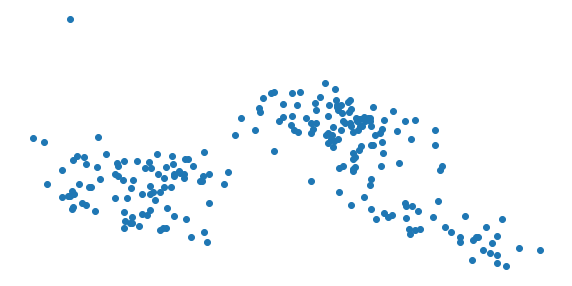

In [36]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(pca[:, 0], pca[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [37]:
# Evaluate adjusted rand index (ARI) and silhouette score
ari = metrics.adjusted_rand_score(y['pyr_sensitivity'], y_pred)
ss = metrics.silhouette_score(X_pca, y_pred, metric='euclidean')

print('ARI: {}\n'.format(ari))
print('Silhouette Score: {}'.format(ss))

ARI: -0.015691572743083516

Silhouette Score: 0.09567083437487343


### GMM

In [38]:
# Use GMM to cluster based on gene expression (PCA)
gmm_cluster = GaussianMixture(n_components=3,
                              covariance_type='tied',
                              random_state=123)

y_pred = gmm_cluster.fit_predict(X_pca)

# Use first two PCA components for visualization
pca = PCA(n_components=2).fit_transform(X_pca)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

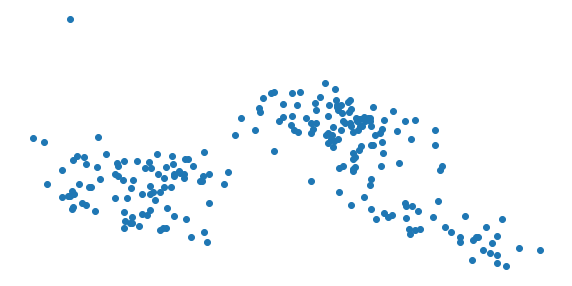

In [39]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(pca[:, 0], pca[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

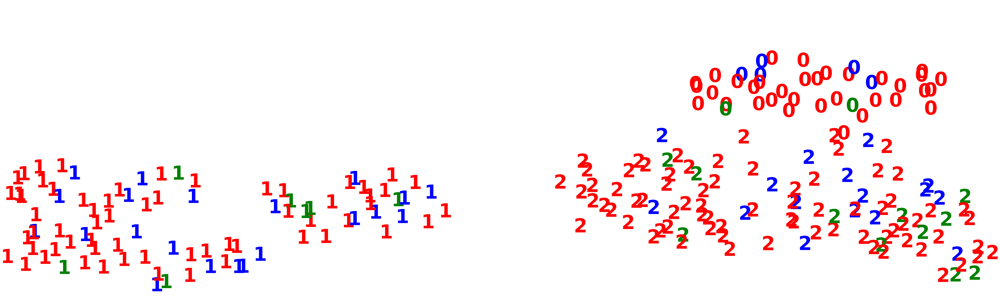

In [40]:
# Use UMAP to reduce dimensionality for visualization
umap_results = umap.UMAP(n_neighbors=25,
                      min_dist=0.9,
                      metric='euclidean').fit_transform(X_pca)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

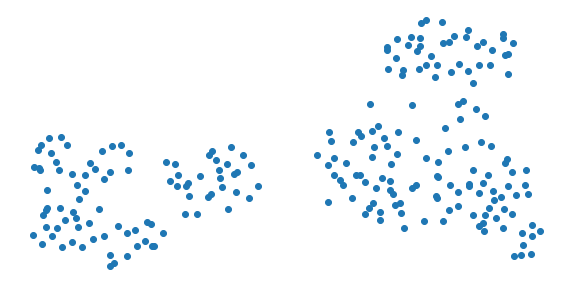

In [41]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [42]:
# Evaluate adjusted rand index (ARI) and silhouette score
ari = metrics.adjusted_rand_score(y['pyr_sensitivity'], y_pred)
ss = metrics.silhouette_score(X_pca, y_pred, metric='euclidean')

print('ARI: {}\n'.format(ari))
print('Silhouette Score: {}'.format(ss))

ARI: -0.015606413664654414

Silhouette Score: 0.14624384698649887


#### Conclusions
* The PCA- and UMAP-based visualizations of the unsupervised clusters only resulted in two spatially separable clusters, which is reflected in the poor silhouette scores across all four models.
* All three sensitivity groups (or colors) appear in all three gene expression clusters, which is reflected in the poor ARI scores across all four models. This suggests that in vitro pyrimethamine sensitivity is not tied to gene expression patterns in this panel of cancer cell lines.

## UMAP for Dimensionality Reduction

In [76]:
# Perform UMAP for dimensionality reduction
results = umap.UMAP(n_components=100).fit_transform(X_exp_mm)
results.shape

(231, 100)

In [77]:
# Use umap components as features in model
X_umap = pd.DataFrame(data=results)

# Review resulting data frame
X_umap

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-8.362843,0.744467,-1.128301,-4.434682,0.675012,-0.314914,1.184495,0.733194,0.446671,-0.158071,...,1.280209,1.416275,-0.077262,-1.412353,0.759255,-0.170834,-0.052961,-1.185146,0.048500,0.014036
1,-9.024146,1.221771,-0.832475,-4.903810,1.126732,-0.058530,0.624319,0.966689,0.496562,-0.415441,...,1.447812,1.503445,-0.280841,-1.563251,0.823531,-0.477341,0.282781,-1.444787,-0.221868,0.595438
2,3.747854,0.354843,-0.280350,-0.324794,-0.728032,0.822897,-0.264336,-0.078682,0.189854,-0.362440,...,0.614493,-0.012024,-0.038799,0.321594,0.319509,-0.301284,0.297301,0.132274,0.287699,-0.573907
3,4.172256,1.202447,-0.057903,0.317083,-0.828865,1.092811,-0.581936,-0.425336,0.239864,-0.485757,...,0.487925,-0.013244,-0.082325,0.457864,0.451450,-0.304537,0.360808,0.376646,0.475824,-0.591218
4,4.141335,1.122932,-0.062421,0.236211,-0.902824,1.091620,-0.582752,-0.480528,0.219993,-0.502384,...,0.462611,0.051658,-0.059570,0.421441,0.345696,-0.296319,0.382796,0.403917,0.427671,-0.518630
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,4.759233,2.397237,0.369572,1.446394,-0.868900,1.332759,-0.799193,-1.345481,0.369324,-1.203902,...,-0.165311,0.255946,-0.031621,0.297679,0.001579,0.084205,0.263434,1.173376,0.429648,0.020738
227,-8.964627,1.170018,-0.841262,-4.851967,1.098027,-0.056242,0.611298,0.946206,0.459834,-0.427308,...,1.417107,1.451310,-0.260864,-1.542134,0.811581,-0.466573,0.276721,-1.445919,-0.211274,0.594483
228,4.749228,2.398347,0.352875,1.469230,-0.854892,1.288308,-0.783548,-1.287575,0.332937,-1.196058,...,-0.210035,0.221921,0.002643,0.252990,-0.027725,0.112733,0.222420,1.187084,0.404480,0.057146
229,4.628440,2.056151,0.382283,1.167179,-0.922398,1.257684,-0.657964,-1.036242,0.442358,-1.108991,...,-0.041686,0.175902,-0.061428,0.313188,0.044381,0.096960,0.208195,1.108686,0.349104,-0.049918


## Clustering and Visualization
Cluster cell lines by gene expression (numbers) and overlay sensitivity (color)

### K-means

In [124]:
# Use k-means to cluster based on gene expression (UMAP)
k_means = KMeans(n_clusters=6, random_state=123)
y_pred = k_means.fit_predict(X_umap)

# Use UMAP to reduce dimensionality for visualization
umap_results = umap.UMAP(n_neighbors=25,
                      min_dist=0.9,
                      metric='euclidean').fit_transform(X_umap)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 4 separate connected components using meta-embedding (experimental)
  n_components


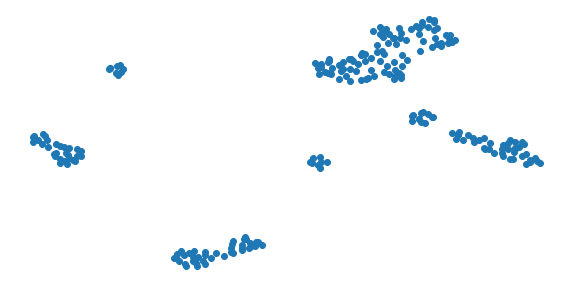

In [125]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [126]:
# Evaluate adjusted rand index (ARI) and silhouette score
ari = metrics.adjusted_rand_score(y['pyr_sensitivity'], y_pred)
ss = metrics.silhouette_score(X_umap, y_pred, metric='euclidean')

print('ARI: {}\n'.format(ari))
print('Silhouette Score: {}'.format(ss))

ARI: 0.013513299317354286

Silhouette Score: 0.6226832270622253


#### Conclusion
The ARI score is not much better than random (just barely over 0), suggesting little relationship between sensitivity and gene expresssion. The silhouette score
is okay (closer to 1 than 0), suggesting relatively tight and separate clusters based on gene expression.

### Hierarchical

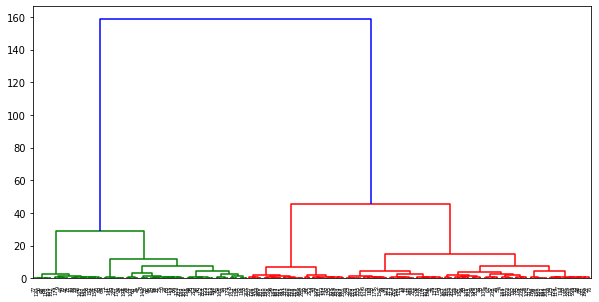

In [127]:
# Use dendrogram to select parameters for hierarchical clustering
plt.figure(figsize=(10, 5))
dendrogram(linkage(X_umap, method='ward'))
plt.show()

In [134]:
# Use hierarchical clustering to cluster based on gene expression (UMAP)
agg_cluster = AgglomerativeClustering(linkage='ward', 
                                      affinity='euclidean',
                                      n_clusters=3)

y_pred = agg_cluster.fit_predict(X_umap)

# Use UMAP to reduce dimensionality for visualization
umap_results = umap.UMAP(n_neighbors=25,
                      min_dist=0.9,
                      metric='euclidean').fit_transform(X_umap)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 4 separate connected components using meta-embedding (experimental)
  n_components


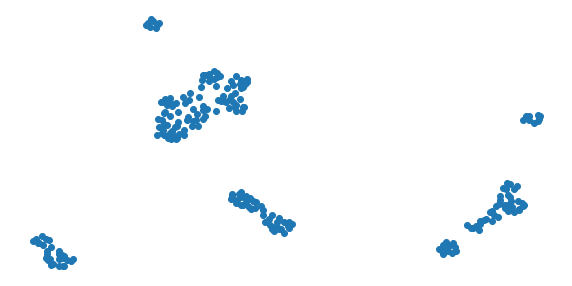

In [135]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

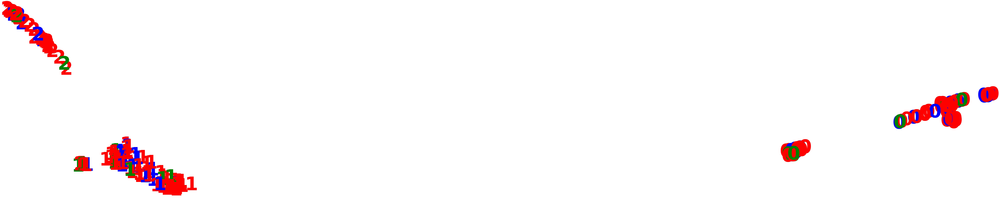

In [136]:
# Use first two PCA components for visualization
pca = PCA(n_components=2).fit_transform(X_umap)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

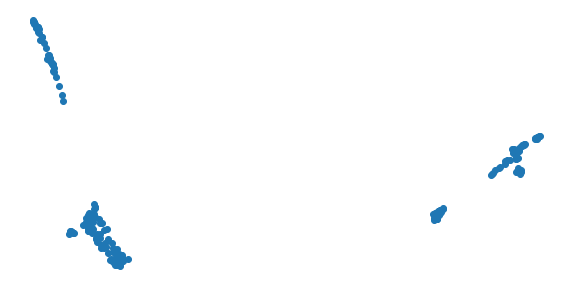

In [137]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(pca[:, 0], pca[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [138]:
# Evaluate adjusted rand index (ARI) and silhouette score
ari = metrics.adjusted_rand_score(y['pyr_sensitivity'], y_pred)
ss = metrics.silhouette_score(X_umap, y_pred, metric='euclidean')

print('ARI: {}\n'.format(ari))
print('Silhouette Score: {}'.format(ss))

ARI: -0.014748060702945607

Silhouette Score: 0.7699920535087585


#### Conclusion
The ARI score is slightly worse than random (just below 0), again suggesting no relationship between sensitivity and gene expresssion. The silhouette score is pretty high (closer to 1 than 0), suggesting tight and separate clusters based on gene expression.

### DBSCAN

In [150]:
# Use DBSCAN to cluster based on gene expression (UMAP)
dbscan_cluster = DBSCAN(eps=2, min_samples=25)

y_pred = dbscan_cluster.fit_predict(X_umap)

# Use UMAP to reduce dimensionality for visualization
umap_results = umap.UMAP(n_neighbors=25,
                      min_dist=0.9,
                      metric='euclidean').fit_transform(X_umap)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 4 separate connected components using meta-embedding (experimental)
  n_components


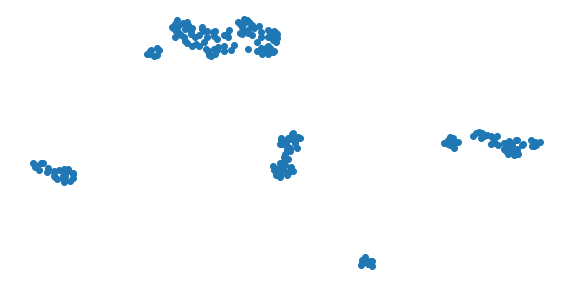

In [151]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [152]:
# Evaluate adjusted rand index (ARI) and silhouette score
ari = metrics.adjusted_rand_score(y['pyr_sensitivity'], y_pred)
ss = metrics.silhouette_score(X_umap, y_pred, metric='euclidean')

print('ARI: {}\n'.format(ari))
print('Silhouette Score: {}'.format(ss))

ARI: 0.0018482081736419034

Silhouette Score: 0.7409270405769348


#### Conclusion
The ARI score is slightly better than random (just barely above 0), again suggesting little relationship between sensitivity and gene expresssion. The silhouette score is pretty high (closer to 1 than 0, similar to silhouette score for the hierarchical model above), suggesting tight and separate clusters based on gene expression (4 labeled clusters).

### GMM

In [168]:
# Use GMM to cluster based on gene expression (UMAP)
gmm_cluster = GaussianMixture(n_components=3,
                              covariance_type='tied',
                              random_state=123)

y_pred = gmm_cluster.fit_predict(X_umap)

# Use UMAP to reduce dimensionality for visualization
umap_results = umap.UMAP(n_neighbors=25,
                      min_dist=0.9,
                      metric='euclidean').fit_transform(X_umap)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 200}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 4 separate connected components using meta-embedding (experimental)
  n_components


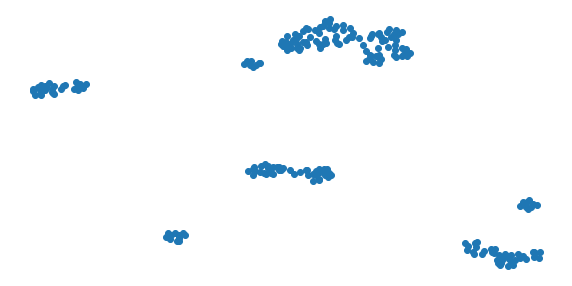

In [169]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

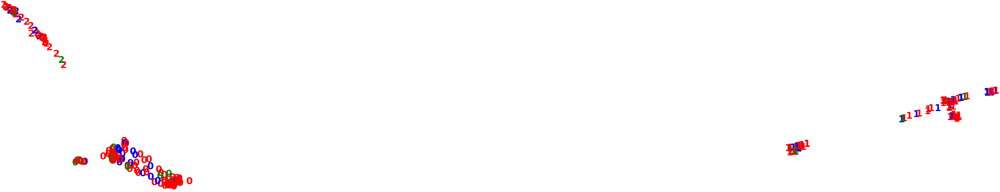

In [170]:
# Use first two PCA components for visualization
pca = PCA(n_components=2).fit_transform(X_umap)

plt.figure(figsize=(10, 5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred[i]),
             color=colours[y['pyr_sensitivity'][i]],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

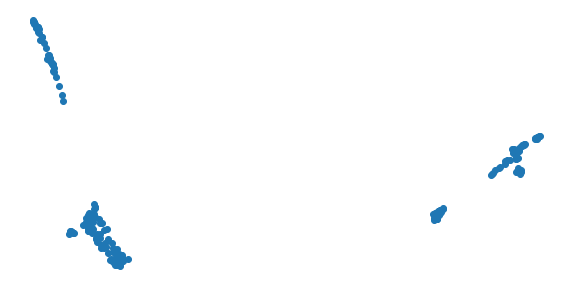

In [171]:
# Plot clusters without sensitivity (color)
plt.figure(figsize=(10, 5))
plt.scatter(pca[:, 0], pca[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [172]:
# Evaluate adjusted rand index (ARI) and silhouette score
ari = metrics.adjusted_rand_score(y['pyr_sensitivity'], y_pred)
ss = metrics.silhouette_score(X_umap, y_pred, metric='euclidean')

print('ARI: {}\n'.format(ari))
print('Silhouette Score: {}'.format(ss))

ARI: -0.014748060702945607

Silhouette Score: 0.7699920535087585


#### Conclusion
The ARI score is slightly worse than random (just below 0), again suggesting no relationship between sensitivity and gene expresssion. The silhouette score is the highest of the four models (closer to 1 than 0), suggesting tight and separate clusters based on gene expression.

# Conclusions

The strong silhouette scores for many of the models suggest that groups of cell lines demonstrate similar gene expression patterns. It would be interesting to overlay disease types on these clusters to see if cell lines from certain diseases have similar gene expression profiles.

The poor ARI scores throughout (as also seen by red, blue, and green showing up together in many, if not most, of the gene expression clusters) suggest that in vitro pyrimethamine sensitivity is not related to gene expression patterns in cancer cell lines. This also suggests that gene expression patterns in human beings would not be predictive of response to pyrimethmine. Thus, additional analyses are needed to understand how pyrimethamine kills cancer cells as well as which patients will respond to pyrimethamine treatment.

The main shortcomings of this unsupervised analysis as a whole are:
1. The relatively small sample size (only had sensitivity data and gene expression data for 231 cell lines).
2. The poor relatively poor separation between sensitive, partially sensitive, and resistant cell lines (data isn't really ideal for clustering).
3. The imperfect correlation between mRNA expression and protein expression.

With regards to issue number 3 above, I would like to repeat this analysis using protein expression data. Since pyrimethamine likely acts by inhibiting a protein or group of proteins, protein expression is a much more direct measure than mRNA expression. The challenge is that quantitative proteomics data is much more difficult to find and process than mRNA expression data.